<a href="https://colab.research.google.com/github/Seralestis/mon-projet-data-science/blob/feature%2Feda-initial/TP_2_1_THOLIMET_Alexis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
files.upload()


Saving listings.csv to listings.csv


{'listings.csv': b'id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license\n2719440,Nice flat close to Montparnasse,13915159,Thibaut,,Palais-Bourbon,48.84997,2.31974,Entire home/apt,,2,79,2020-03-13,0.57,1,0,0,7510702406383\n2721397,"Marais - Charming loft, river view",13925876,Cecilie,,H\xc3\xb4tel-de-Ville,48.85203,2.36176,Entire home/apt,,5,88,2025-08-29,0.66,1,44,13,7510400455677\n2726092,Superbe 2 pi\xc3\xa8ces id\xc3\xa9alement plac\xc3\xa9,13612373,Clemence,,Batignolles-Monceau,48.88004,2.30686,Entire home/apt,,365,0,,,1,0,0,\n2726327,"Cozy place, Sacr\xc3\xa9 Coeur Montmartre in the SoPi",7483725,H\xc3\xa9l\xc3\xa8ne,,Op\xc3\xa9ra,48.88271,2.34355,Entire home/apt,,3,99,2025-07-03,0.72,1,297,8,7510901014972\n2727929,Appartement d\'architecte - Montmartre,13960346,Paul,,Buttes-Montmartre,48.894917008457

Partie 1 : Exploration du fichier

In [24]:
import pandas as pd
import time
import psutil
import os


In [49]:
pd.options.display.float_format = '{:,.2f}'.format

1. Chargement optimisé

In [31]:
process = psutil.Process(os.getpid())

mem_before = process.memory_info().rss / 1024**2
start_time = time.time()

df = pd.read_csv("/content/listings.csv")

end_time = time.time()
mem_after = process.memory_info().rss / 1024**2

print(f"Temps de chargement : {end_time - start_time:.2f} secondes")
print(f"Mémoire utilisée : {mem_after - mem_before:.2f} MB")


Temps de chargement : 0.29 secondes
Mémoire utilisée : 9.52 MB


In [32]:
df.shape

(81853, 18)

In [33]:
df.dtypes

,0
id,int64
name,object
host_id,int64
host_name,object
neighbourhood_group,float64
neighbourhood,object
latitude,float64
longitude,float64
room_type,object
price,float64


Pandas détecte automatiquement les types de données lors du chargement du fichier, en attribuant principalement les types int64, float64 et object. Néanmoins, ces types ne sont pas toujours optimaux. En particulier, les colonnes object correspondant à des variables catégorielles (comme room_type ou neighbourhood) peuvent être converties en type category, et certaines colonnes numériques peuvent être converties en types de plus faible précision (int32, float32) sans perte d’information.

In [34]:
df.select_dtypes(include="object").head()


,name,host_name,neighbourhood,room_type,last_review,license
0,Nice flat close to Montparnasse,Thibaut,Palais-Bourbon,Entire home/apt,2020-03-13,7510702406383
1,"Marais - Charming loft, river view",Cecilie,Hôtel-de-Ville,Entire home/apt,2025-08-29,7510400455677
2,Superbe 2 pièces idéalement placé,Clemence,Batignolles-Monceau,Entire home/apt,NaN,NaN
3,"Cozy place, Sacré Coeur Montmartre in the SoPi",Hélène,Opéra,Entire home/apt,2025-07-03,7510901014972
4,Appartement d'architecte - Montmartre,Paul,Buttes-Montmartre,Entire home/apt,2025-07-20,7511808333770


In [35]:
dtypes_optimises = {
    "room_type": "category",
    "neighbourhood": "category",
    "last_review": "category"
}

process = psutil.Process(os.getpid())
mem_before = process.memory_info().rss / 1024**2
start_time = time.time()

df_opt = pd.read_csv(
    "/content/listings.csv",
    dtype=dtypes_optimises,
    parse_dates=["last_review"]
)

end_time = time.time()
mem_after = process.memory_info().rss / 1024**2

print(f"Temps optimisé : {end_time - start_time:.2f} secondes")
print(f"Mémoire optimisée : {mem_after - mem_before:.2f} MB")

Temps optimisé : 0.70 secondes
Mémoire optimisée : 15.54 MB


In [36]:
mem_df = df.memory_usage(deep=True).sum() / 1024**2
mem_df_opt = df_opt.memory_usage(deep=True).sum() / 1024**2

print(f"Mémoire df original : {mem_df:.2f} MB")
print(f"Mémoire df optimisé : {mem_df_opt:.2f} MB")
print(f"Gain mémoire : {mem_df - mem_df_opt:.2f} MB")


Mémoire df original : 38.11 MB
Mémoire df optimisé : 24.78 MB
Gain mémoire : 13.33 MB


2. Premières statistiques

In [38]:
df_opt.shape


(81853, 18)

In [39]:
df_opt.memory_usage(deep=True).sum() / 1024**2


np.float64(24.77802276611328)

In [40]:
df_opt.dtypes.value_counts()


,count
int64,7
float64,5
object,3
category,1
category,1
datetime64[ns],1


In [41]:
df_opt.dtypes

,0
id,int64
name,object
host_id,int64
host_name,object
neighbourhood_group,float64
neighbourhood,category
latitude,float64
longitude,float64
room_type,category
price,float64


Partie 2 : Métriques Qualité

1. Complétude

In [42]:
completude = (1 - df_opt.isna().mean()) * 100
completude = completude.sort_values()

completude


,0
neighbourhood_group,0.000000
price,0.000000
last_review,78.058226
reviews_per_month,78.058226
license,78.918305
host_name,99.975566
name,100.000000
host_id,100.000000
longitude,100.000000
latitude,100.000000


2. Cardinalitié

In [43]:
cols_cat = df_opt.select_dtypes(include=["object", "category"]).columns


In [44]:
cardinalite = df_opt[cols_cat].nunique().sort_values(ascending=False)
cardinalite


,0
name,76096
license,52486
host_name,11296
neighbourhood,20
room_type,4


3. Distribution

In [45]:
cols_num = df_opt.select_dtypes(include=["int", "float"]).columns


In [50]:
distribution = df_opt[cols_num].agg(
    ["min", "max", "mean", "median"]
).T

distribution


,min,max,mean,median
id,"3,109.00","1,482,028,708,285,108,480.00","647,476,896,027,086,592.00","841,750,980,580,785,792.00"
host_id,"2,626.00","717,175,691.00","188,163,859.60","74,266,499.00"
neighbourhood_group,NaN,NaN,NaN,NaN
latitude,48.82,48.90,48.86,48.87
longitude,2.23,2.47,2.34,2.35
price,NaN,NaN,NaN,NaN
minimum_nights,1.00,"1,000.00",44.05,3.00
number_of_reviews,0.00,"4,040.00",27.23,7.00
reviews_per_month,0.01,67.92,1.03,0.56
calculated_host_listings_count,1.00,816.00,23.15,1.00


4. Incohérence

In [47]:
def detect_outliers_iqr(series):
    q1 = series.quantile(0.25)
    q3 = series.quantile(0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    return ((series < lower) | (series > upper)).sum()


In [48]:
outliers = {}

for col in cols_num:
    outliers[col] = detect_outliers_iqr(df_opt[col].dropna())

outliers_df = pd.DataFrame.from_dict(
    outliers, orient="index", columns=["nb_outliers"]
).sort_values("nb_outliers", ascending=False)

outliers_df


,nb_outliers
minimum_nights,17694
calculated_host_listings_count,15731
number_of_reviews_ltm,8625
number_of_reviews,8299
reviews_per_month,4402
longitude,47
host_id,0
id,0
latitude,0
neighbourhood_group,0


VIsualisation exigées :

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns

Heatmap :

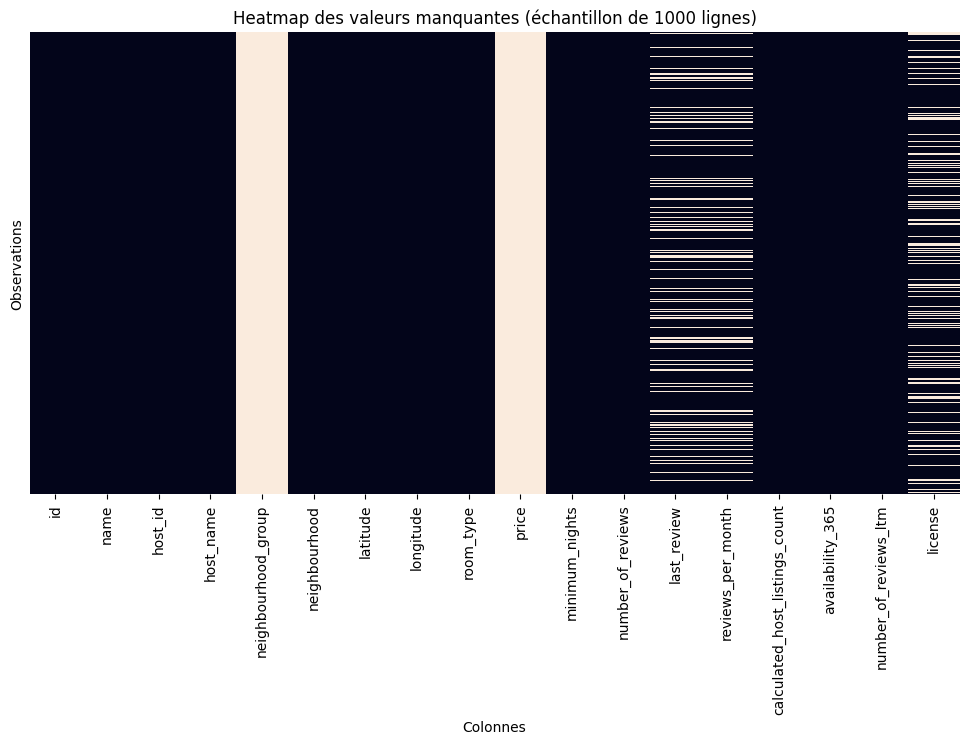

In [55]:
plt.figure(figsize=(12, 6))
sns.heatmap(df_opt.isna().sample(1000, random_state=42),
            cbar=False, yticklabels=False)
plt.title("Heatmap des valeurs manquantes (échantillon de 1000 lignes)")
plt.xlabel("Colonnes")
plt.ylabel("Observations")
plt.show()


On peut constater des colonnes pleines, comme vide pour le "price" et "neighbourhood_group" ainsi que des données ératiques pour "license", "last_review" et "reviews_per_month"

Histogramme :

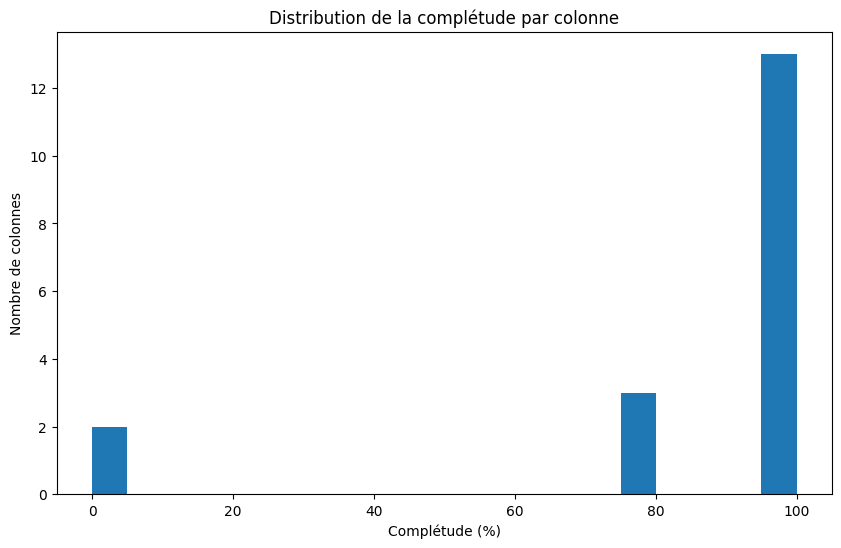

In [56]:
completude = (1 - df_opt.isna().mean()) * 100

plt.figure(figsize=(10, 6))
plt.hist(completude, bins=20)
plt.title("Distribution de la complétude par colonne")
plt.xlabel("Complétude (%)")
plt.ylabel("Nombre de colonnes")
plt.show()


Ce graphique compléte l'analyse de la Heatmap précedente en montrant 2 colonnes complétes vides, 3 avec des données avec quelques trous, et le reste plein

Top 10 :

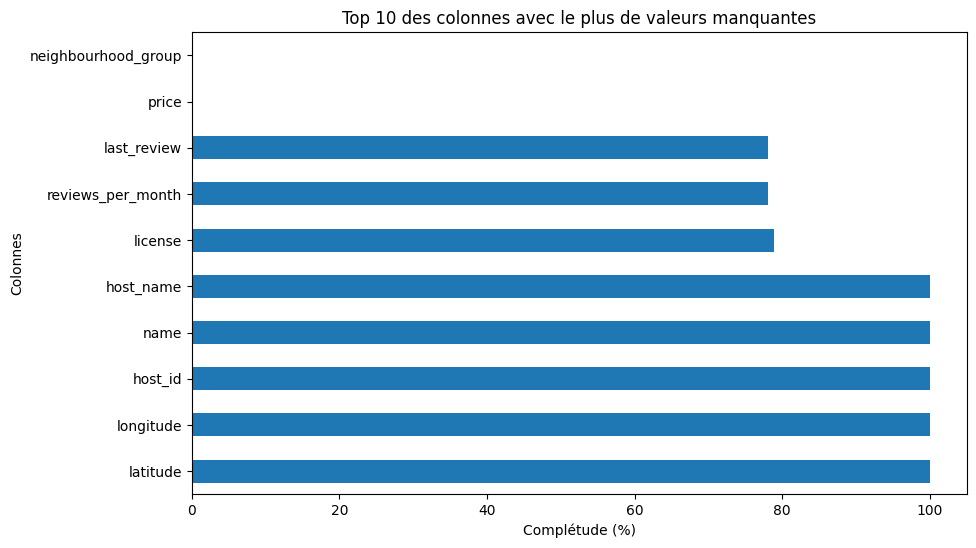

In [57]:
top10_problemes = completude.sort_values().head(10)

plt.figure(figsize=(10, 6))
top10_problemes.plot(kind="barh")
plt.title("Top 10 des colonnes avec le plus de valeurs manquantes")
plt.xlabel("Complétude (%)")
plt.ylabel("Colonnes")
plt.gca().invert_yaxis()
plt.show()


Ici nous pouvons voir en particulier les 5 premières colonnes qui sont problématiques car une complétion inférieur à 100%, le reste étant à 100% il est difficile à dire qu'elles sont problématiques. Nous pouvons plus partir sur un Top 5 des colonnes avec le plus de problèmes

Partie 3 : Analyse Business

1. Colonnes critiques

Les colonnes jugées critiques pour la prédiction du prix d'un logement Airbnb sont les suivantes :

1. **neighbourhood** : le quartier est un facteur déterminant du prix, car il reflète l'attractivité géographique, la proximité des points d'intérêt et le niveau de demande locale.
2. **room_type** : le type de logement (logement entier, chambre privée, chambre partagée) influence directement le prix, un logement entier étant généralement plus cher qu'une simple chambre.
3. **minimum_nights** : le nombre minimum de nuits imposé peut avoir un impact sur le prix, les séjours plus contraignants étant souvent associés à des tarifs spécifiques.
4. **calculated_host_listings_count** : le nombre d'annonces gérées par un même hôte peut refléter un niveau de professionnalisation, susceptible d'influencer la stratégie tarifaire.
5. **availability_365** : une faible disponibilité sur l'année peut indiquer une forte demande pour le logement, ce qui peut se traduire par des prix plus élevés.

Ces variables combinent des dimensions géographiques, structurelles et comportementales, ce qui en fait des indicateurs clés pour expliquer et prédire le prix des logements Airbnb.


2. Problèmes prioritaires

Les principaux problèmes de qualité des données, classés par impact business, sont :

1. Colonnes manquantes pour certaines informations, comme par exemple si au niveau de l'électroménager, il y a suffisament d'objets, si il est proche de points culturels, de transports en commun etc...

2. Présence de valeurs aberrantes dans des colonnes comme un nombre de nuits minimum excessivement élevé peuvent fausser les résultats.

3. Forte cardinalité de certaines variables catégorielles
Des colonnes comme property_type ou neighbourhood peuvent compliquer la modélisation et augmenter la complexité des modèles.

4. Colonnes peu exploitables en raison d'une faible complétude
Certaines variables présentent trop de valeurs manquantes pour être utilisées efficacement. Dans ce cas ci ce ne sont que des "reviews" mais dans un cas réel cela impacterai l'analyse.

3. Recommandations

1. Traitement des valeurs manquantes

Supprimer les colonnes présentant une complétude trop faible ou appliquer des méthodes d'imputation adaptées (médiane pour les variables numériques, modalité la plus fréquente pour les variables catégorielles).

2. Gestion des valeurs aberrantes

Identifier et traiter les outliers à l'aide de méthodes statistiques (IQR), par exemple en les supprimant ou en les plafonnant (winsorisation).

3. Optimisation et transformation des variables

Convertir les variables catégorielles en type category, transformer les dates et normaliser certaines variables numériques afin de faciliter la modélisation.